In [1]:
from bs4 import BeautifulSoup as bs
import requests as req
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np

In [2]:
genotypes = 'http://mtweb.cs.ucl.ac.uk/HSMICE/GENOTYPES/'
# alleles = ['chr{}.Build37.alleles'.format(i) for i in range(1, 21)]
data = ['chr{}.Build37.data'.format(i) for i in range(1, 21)]

## DO NOT RUN BELOW CELL!! TAKES > 2 MINUTES!!!

In [3]:
raw = [req.get(genotypes + d).content for d in data]

## DO NOT RUN ABOVE CELL!!!

In [4]:
def parse(d):
    s = str(d)
    return s.split('\\n')

In [5]:
d = {}
for i in range(1, 21):
    d[i] = parse(raw[i-1])

In [6]:
d[1][0].index(' A')

28

In [7]:
d[1]

["b'1_47 6.13:E2.5(4) 0 0 1 NA A G A G A G A G C C A T G G A G A G A G G G A G G G A G A G G G C G A G A A G G A C A C A C A G G G A C C G A G A A A G A A A C A G A G G G A A G G C G A A A A A A A G A G A T A G A C A C A C A C G G A T A C A C G G G G G G A A A A A A G G G G C C A A G G A A G G G G C C G G G G G G A A G G G G A A A A A A A A G G T T A A A A A A C C A A A A G G A A A A A A A A G G G G A A A A G G A A G G A A A A A A G G G G A A G G G G A A G G G G G G G G A A A A G G A A G G C C G G T T A A G G A A G G A A A A A A A A G G C C G G G G A A C C A A T T A A G G G G A A A A A A T T G G G G G G C C G G G G G G A T A G C C C C A G A G A G C G A G A G A G A G A C A C A G A C G G A G A G G G A A A A C C A G A G A G A G A A C C A G A C A G G G A C G G G G G G A G A C G G A G A C A G A G A G A G A G A G A G A C A G A T A C A G A G A C A G A A G G A A G G G G A A G G A A A A G G G G G G A A G G G G A A G G G G A A A A A A A A C G A G A T A A A G A T A G A G G G A A G G G G G G G G A

In [8]:
dna_map = {}
for x in d.keys():
    dna_map[x] = []
    for y in range(len(d[x])):
        if len(d[x][y]) != 1:
            A = d[x][y].index(' A ')
            C = d[x][y].index(' C ')
            G = d[x][y].index(' G ')
            T = d[x][y].index(' T ')
            NA = d[x][y].index(' NA ')
            index = min(A, C, G, T, NA)
            dna_map[x].append(d[x][y][index:][1:])

Making all dna sequences length the same across chromosomes

In [9]:
min_dict = {}
for key in dna_map.keys():
    min = 1000000
    for i in range(len(dna_map[key])):
        if len(dna_map[key][i]) < min:
            min = len(dna_map[key][i])
    min_dict[key] = min

for key in dna_map.keys():
    for i in range(len(dna_map[key])):
        dna_map[key][i] = dna_map[key][i][:min_dict[key]]

In [10]:
def build_prefix_array(X):
    M = len(X)
    N = len(X[0])
    ppa = list(range(M))

    for k in range(N - 1):
        a = list()
        c = list()
        g = list()
        t = list()
        n = list()

        for index in ppa:
            h = X[index]
            allele = h[k]
            if allele == 'A':
                a.append(index)
            elif allele == 'C':
                c.append(index)
            elif allele == 'G':
                g.append(index)
            elif allele == 'T':
                t.append(index)
            else:
                n.append(index)
            
        ppa = a + c + g + t + n
    
    return ppa

In [11]:
def display_prefix_array(X):
    from IPython.display import display_html
    ppa = build_prefix_array(X)
    html = '<pre style="line-height: 100%">'
    for index in ppa:
        haplotype = X[index]
        html += str(index) + '|' + ''.join(str(allele) for allele in haplotype[:-1])
        html += '  ' + str(haplotype[-1]) + '<br/>'
    html += '</pre>'
    display_html(html, raw=True)

In [12]:
display_prefix_array(dna_map[1])

368|NA A G A G A G A G C C A T G G A G A G A G G G A G G G A G A G NA NA C G A G A A G G A C A C A C A G G G A C C G A G A A A G A A A C A G A G G G A A G G C G A A A A A A A G A G A T A G A C A C A C A C G G A T A C A C G G G G G G A A A A A A G G G G C C A A G G A A G G G G C C G G G G NA NA A A G G G G A A A T A C A A A G A T A C A G A A NA NA A A A A G G A A A C A C A T A G A G A C A G A G A C A G A G A A A A G G G G A A G G A G A G G G G G G G NA NA A A A A G G G G A G A A A G A T A T G G A C A G C C A C A G A G A G A C A G G G A G C C A T A T G G A G NA NA A G A A A C A A G G NA NA G G G G G G A G A G T T A G C C C C A G G G A A C G A G A G A A A A A A C C A G A C A G A G A G A A A A C C C C A A A G A A A G A C C G G G C C G G A G C C A G A G A G A G A C NA NA A G A C A G A G A G A G A G A G A G A C A G A T A C A G A G A C A G A G A G A G C G A G A A G G A A A A G G G G G G A A A G G G A A G G G G A A A G A G A C G G A G A T A A G G A A G G G G G G A A G G G G G G G G A A A A G G C C NA NA G G G G T T A A A A A A G G A A A A A A T T C C A A G G G G A A A A C C G G A A G G A A G G A A NA NA G G T T C C G G C C A A A A G G A A A A A A G G A A G G A A A A G G G G G G C C A A A A A A C C G G A A T T G G A A G G A A G G A A G G A A G G A A A A G G G G C G A C C C A G A G A G NA NA C C A A A C A G A C A C G G G G G G A A A A G G A A C C C C A A G G G G G G C C G G C C G G A A A A G G G G A A A G G G G G A G A G A G A G A G A G A C A C C G A G A G A T A G A T A G A T A C A G A G A G A C A G C G A A G G G G C C A A A A A A A G A G A G A G A G A G A G A G A A A A A G A G A C A G A G A G A G A G A G T T A G G G G G A A G G G G G G G G G G G G A A A A A A A A A A T T NA NA T T C C A A A A A A T T G G G G A A T T A A A A G G C C A A T T A A T T A A A A T T A A A C NA NA A A A C A T G G A G A G A G A C A G A G T T A G A G A G A G A G A G A C A C A G A C A T A G A T A T A G A A C C A A A C A A A C A G G G A T C C A G A G A G A G A G A C A G A G A G A G A G A G A C C C A G A C A C A G A A G G A A A A T T G G G G A A G G A A A A A A NA NA G G A A T T NA NA A A G G C C G G A A A A A A G G A A G G C C A A T T G G A A G G A A NA NA G G G G A A A A G G A G A G A G A G A G A G A C A G A G A G A A G G G G A A A A G G G G G G G G G G C C A A A G A A A A NA NA A A G G T T NA NA G G G G A A A A A T G G A G G G A A A A A G C G A G A G A G A T NA NA A G C G A G A G A G A G C G A G A G A T G G A A G G G G C C T T T T G G T T A G A A G G G G A G A C A NA NA NA G G G G A A A A G G A G A G A G A G A C A G A G A G A C A G A G A G A C G G C C T T C C G G T T A A A A T T T T A T A G G G A G A G C C A A A A A A A A G G G G A A G G G G A A G G A A G G A A A A A A A A A A A A A A A A G G A A A A A A G G A A A A G G A A G G A A G G C C A G A C A G A G G G A A G G NA NA G G A A G G A A A A G G G G A A G G A A A A A A G G G G G G A A A A A A A A G G A A A A A A A A G G A A A A G G A A C C A A G G G G A A G G C C G G C C G G G G A A A A A A A A T T A A T T A A NA NA A A A G A A A A A A A G A G A G C G A G G G A C A G A G A G A G A G A G A C A G A G A G G G A G A G A G C G A G A G A G G G A G C C A A A A G G A G A G A G A G A G A A G G A C A G A G A A G G A G A G A G A T A C A G A G A C A C A A G G G G G G A A C C A A A A A A A A G G A A A A A G A G A G G G A A A G A T A G G G G G A A A T A G G G A G A A A G A G A G A C A A A A A A G G G G G G G G G G G G G G A A A G A A A A A A G G A A G G A A A A C G A G A A A A G G A A C C A A A G A G A A G G A A A A G G A A A A 871|NA A G A G A G A G A C A T C G G G A G A G G G A G A G A A G G A G C G A G A G A G C C A C A C A G G G A C C G A G A A A G A G C C A A A G G G A A G G C G A A A A A A A G A G A T A G A C A C A C A C G G A T A C A C G G G G G G A A A A A A G G G G C C A A G G A A G G G G C C G G G G G G A A C G G G A G A T A C A G A G A A A C G G A G A C A A A A G G A G A C A C T T A G A G A C G G A G A C A G A G A G A C A G A G A G A G A G A G G G G G G G G G A A A T A NA A A G G C C G G T T A A G G A A G G A C A 

In [13]:
def display_allele(X, chr_num):
    bases = ['A', 'C', 'G', 'T', 'NA']
    ppa = build_prefix_array(X)
    alleles = []
    for index in ppa:
        haplotype = X[index]
        alleles.append(str(haplotype[-1]))
    height = [alleles.count(base) for base in bases]
    b = plt.bar(bases, height, align='center', alpha = 0.5, color = ['red', 'cyan', 'green', 'yellow', 'orange'])
    plt.xticks(np.arange(len(bases)), bases)
    plt.ylabel('Frequency')
    plt.title('Chromosome {}'.format(chr_num))
    plt.bar_label(b)
    plt.show()

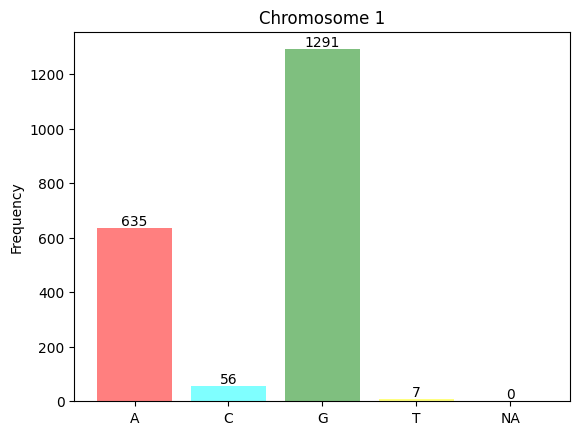

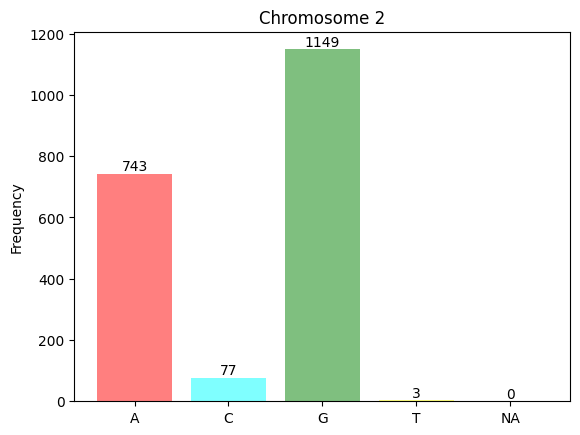

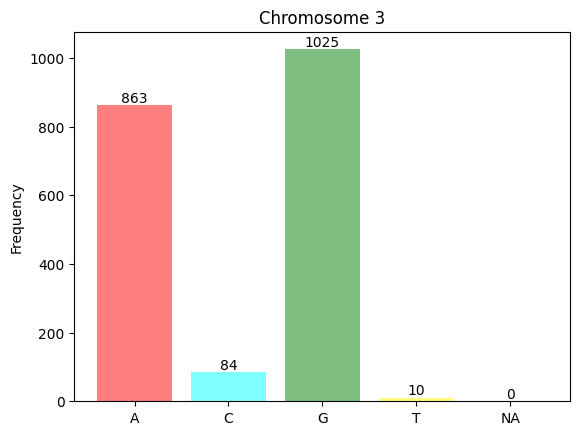

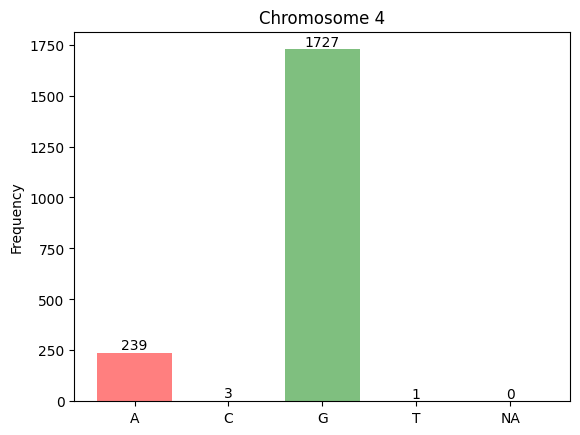

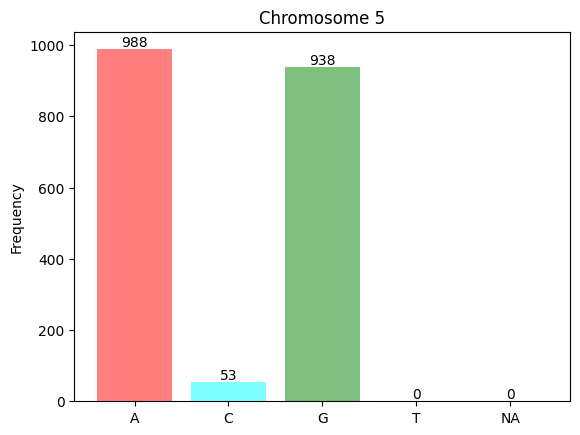

...

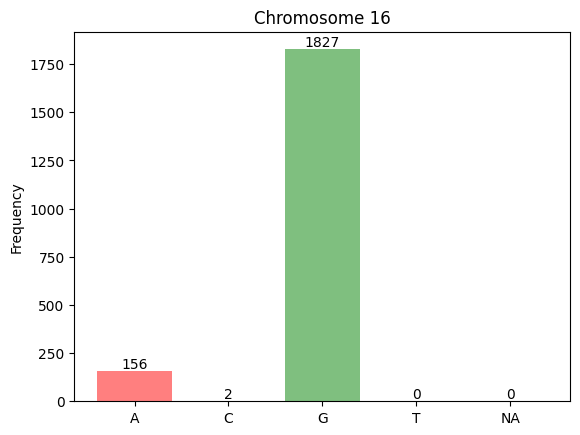

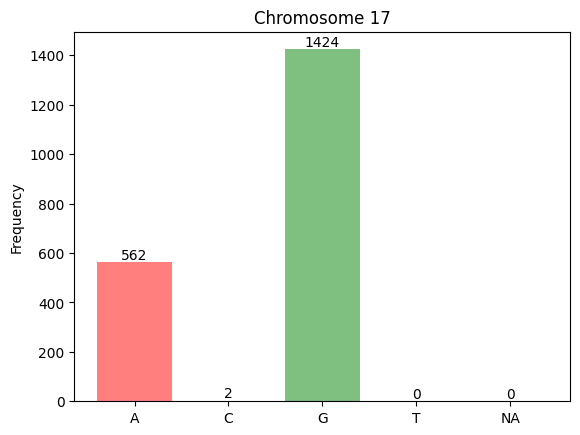

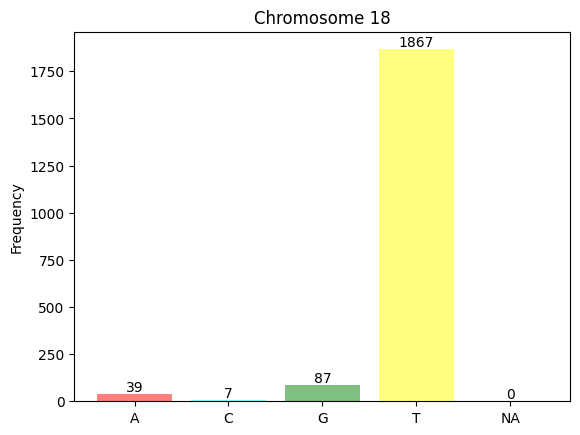

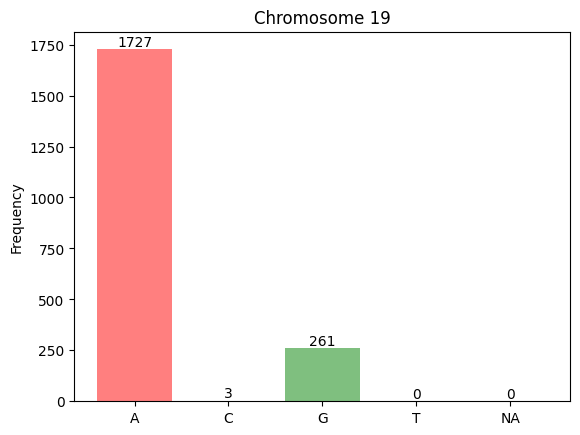

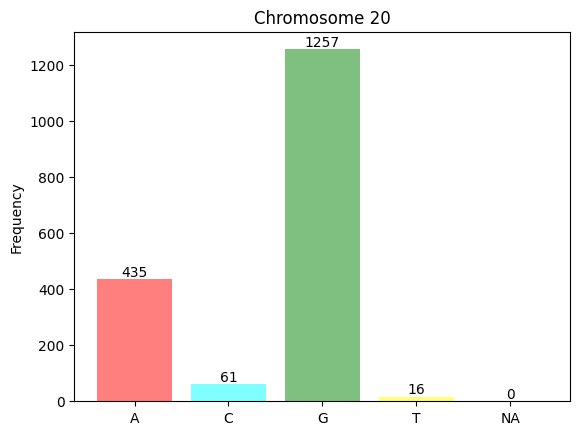

In [14]:
for k in dna_map.keys():
    display_allele(dna_map[k], k)

In [18]:
def build_prefix_and_divergence_arrays(X):
    M = len(X)

    N = len(X[0])

    ppa = list(range(M))

    div = [0] * M

    for k in range(N - 1):
        print(k)
        a = list()
        c = list()
        g = list()
        t = list()
        n = list()

        div_a = list()
        div_c = list()
        div_g = list()
        div_t = list()
        div_n = list()

        na = nc = ng = nt = nn = k + 1

        for index, match_start in zip(ppa, div):
            current = X[index]

            allele = current[k]

            if match_start > na:
                na = match_start
            if match_start > nc:
                nc = match_start
            if match_start > ng:
                ng = match_start
            if match_start > nt:
                nt = match_start
            if match_start > nn:
                nn = match_start
            
            if allele == 'A':
                a.append(index)
                div_a.append(na)
                na = 0
            if allele == 'C':
                c.append(index)
                div_c.append(nc)
                nc = 0
            if allele == 'G':
                g.append(index)
                div_g.append(ng)
                ng = 0
            if allele == 'T':
                t.append(index)
                div_t.append(nt)
                nt = 0
            else:
                n.append(index)
                div_n.append(nn)
                nn = 0
            
        ppa = a + c + g + t + n
        div = div_a + div_c + div_g + div_t + div_n
    
    return ppa, div

In [19]:
ppa, div = build_prefix_and_divergence_arrays(dna_map[1])

0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
31
32
33
34


KeyboardInterrupt: 